# Hikes Of Georgia: EOY Fungi Report
Created by: Darling Ngoh

Email: darlingngoh@gmail.com

"A data quality and visualization report for local Georgia fungi observations, gathered from the Inaturalist database."

- Report Timeframe: 2024 Georgia fungi observations
- Dataset Source: INaturalist.com

Deliverables:
- Overall fungi observation trends.
- Top 10 fungi observed
- Top 5 edible species.
- Top 5 medicinal species.
- Observation hotspots (heatmap or regional breakdown).


2.49 MB	02 Jan 05:14 AM	02 Jan 05:15 AM	02 Jan 05:38 AM	
Query quality_grade=any&identifications=any&iconic_taxa[]=Fungi&place_id=23&year=2024&verifiable=true&spam=false
Columns id, observed_on_string, observed_on, time_observed_at, time_zone, user_id, user_name, quality_grade, url, image_url, num_identification_agreements, num_identification_disagreements, place_guess, latitude, longitude, positional_accuracy, public_positional_accuracy, positioning_method, positioning_device, place_town_name, place_county_name, species_guess, scientific_name, common_name, iconic_taxon_name, taxon_id


In [21]:
# import necessary library 

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Initialize list of edible and medicinal fungi

In [22]:
edible_species = [
    "Cantharellus cibarius",  # Chanterelle
    "Boletus edulis",  # Porcini
    "Pleurotus ostreatus",  # Oyster mushroom
    "Agaricus bisporus",  # Button/Portobello
    "Morchella esculenta",  # Morel
    "Hericium erinaceus",  # Lion's Mane
    "Pleurotus pulmonarius",  # Summer Oyster Mushroom / lung oyster
    "Hericium americanum",  # Bear's Head Tooth
    "Hericium coralloides", # Coral Tooth
    "Cantharellus lateritius",  # Smooth Chanterelle
    "Meripilus sumstinei",  # Black-Staining Polypore
    "Lactarius deliciosus",  # Saffron Milk Cap
    "Craterellus cornucopioides",  # Black Trumpet
    "Hydnum repandum",  # Hedgehog Mushroom
    "Coprinus comatus",  # Shaggy Mane
    "Armillaria mellea",  # Honey Fungus
    "Sparassis crispa",  # Cauliflower Mushroom
    "Tuber melanosporum",  # Black Truffle
    "Clavulina rugosa",  # White Coral Fungus
    "Flammulina velutipes",  # Enoki
    "Russula vesca",  # The Flirt
    "Tricholoma matsutake",  # Matsutake
    "Leccinum scabrum",  # Birch Bolete
    "Suillus luteus",  # Slippery Jack
    "Laetiporus sulphureus",  # Chicken of the Woods
    "Tremella mesenterica",  # Witch's Butter
    "Dacrymyces chrysospermus",  # Orange Jelly Spot
    "Auricularia angiospermarum",  # Wood Ear
    "Cantharellus cinnabarinus",  # Red Chanterelle
    "Baorangia bicolor",  # Two-Colored Bolete
    "Strobilomyces floccopus",  # Old Man of the Woods
    "Lepista nuda",  # Wood Blewits
    "Lactarius indigo",  # Blue Milkcap
    "Auricularia auricula",  # Jelly Ear
    "Craterellus tubaeformis",  # Yellowfoot Chanterelle
    "Ramaria formosa",  # Coral Fungus
    "Hypomyces lactifluorum",  # Lobster Mushroom
    "Cantharellus subalbidus",  # White Chanterelle
    "Hydnum umbilicatum",  # Hedgehog Mushroom
    "Polyozellus multiplex",  # Blue Chanterelle
    "Ramaria botrytis",  # Cauliflower Coral
    "Sparassis spathulata", # Eastern cauliflower mushroom
    "Laetiporus cincinnatus",  # White-Pored Chicken of the Woods
    "Panus conchatus",  # Lilac Oyster Mushroom
    "Xylaria polymorpha",  # Dead Man's Fingers (antimicrobial properties)
    "Ganoderma applanatum",  # Artist's Conk
    "Russula nigricans",  # Blackening Russula
    "Ganoderma tsugae",  # Hemlock Reishi
    "Piptoporus betulinus",  # Birch Bracket Mushroom
    "Agaricus subrufescens",  # Almond Mushroom
    "Calvatia gigantea",  # Giant Puffball
    "Fomitopsis betulina",  # Birch Polypore
    "Hypsizygus tessellatus",  # Beech Mushroom
    "Chroogomphus rutilus",  # Pine Spike
    "Poria cocos",  # Tuckahoe / Hoelen
    "Auricularia auricula-judae",  # Wood Ear Mushroom
    "Fomitopsis pinicola",  # Red Belted Polypore
    "Tremella fuciformis",  # Snow Fungus / White Jelly Mushroom
    "Polyporus umbellatus",  # Umbrella Polypore
    "Phellinus linteus",  # Mesima
    "Agaricus blazei",  # Agaricus Mushroom (Brazilian Mushroom)
    "Inonotus obliquus",  # Chaga
    "Cordyceps sinensis",  # Caterpillar Fungus
    "Cordyceps militaris",  # Cordyceps
    "Grifola frondosa",  # Maitake
    "Lentinula edodes",  # Shiitake
    "Ganoderma lucidum",  # Reishi
    "Exidia crenata", # American Amber Jelly Fungus
    "Tuber lyonii", # Pecan Truffle
    "Dacryopinax spathularia", # Fan-shaped jelly-fungus
    "Lycoperdon perlatum", # Common Puffball
    "Apioperdon pyriforme", # Pear-shaped Puffball
    "Retiboletus ornatipes", # Ornate-stemmed Bolete
    "Neolentinus lepideus", # Scaly Sawgill / Scaly lentinus
    "Cerioporus squamosus", # Dryad's Saddle
    "Entoloma abortivum", # Aborted Entoloma
    "Calvatia cyathiformis", # Purple-spored Puffball
    
]

medicinal_species = [
    "Ganoderma lucidum",  # Reishi
    "Lentinula edodes",  # Shiitake
    "Hericium erinaceus",  # Lion's Mane
    "Grifola frondosa",  # Maitake
    "Cordyceps militaris",  # Cordyceps
    "Cordyceps sinensis",  # Caterpillar Fungus
    "Trametes versicolor",  # Turkey Tail
    "Inonotus obliquus",  # Chaga
    "Agaricus blazei",  # Agaricus Mushroom (Brazilian Mushroom)
    "Pleurotus ostreatus",  # Oyster Mushroom
    "Phellinus linteus",  # Mesima
    "Polyporus umbellatus",  # Umbrella Polypore
    "Tremella fuciformis",  # Snow Fungus / White Jelly Mushroom
    "Fomitopsis pinicola",  # Red Belted Polypore
    "Auricularia auricula-judae",  # Wood Ear Mushroom
    "Sparassis crispa",  # Cauliflower Mushroom
    "Flammulina velutipes",  # Enoki
    "Poria cocos",  # Tuckahoe / Hoelen
    "Chroogomphus rutilus",  # Pine Spike
    "Lepista nuda",  # Wood Blewit
    "Laetiporus sulphureus",  # Chicken of the Woods (antioxidant properties)
    "Hypsizygus tessellatus",  # Beech Mushroom
    "Tricholoma matsutake",  # Matsutake
    "Fomitopsis betulina",  # Birch Polypore
    "Calvatia gigantea",  # Giant Puffball
    "Coprinus comatus",  # Shaggy Mane
    "Armillaria mellea",  # Honey Fungus
    "Agaricus subrufescens",  # Almond Mushroom
    "Piptoporus betulinus",  # Birch Bracket Mushroom
    "Ganoderma tsugae",  # Hemlock Reishi
    "Craterellus cornucopioides",  # Black Trumpet
    "Russula nigricans",  # Blackening Russula
    "Pleurotus pulmonarius",  # Summer Oyster Mushroom / Lung oyster
    "Hericium americanum",  # Bear's Head Tooth
    "Hericium coralloides", # Coral Tooth
    "Cantharellus lateritius",  # Smooth Chanterelle
    "Ganoderma applanatum",  # Artist's Conk
    "Lactarius deliciosus",  # Saffron Milk Cap
    "Tuber melanosporum",  # Black Truffle
    "Xylaria polymorpha",  # Dead Man's Fingers (antimicrobial properties)
    "Schizophyllum commune",  # Split Gill (immune booster)
    "Panus conchatus",  # Lilac Oyster Mushroom
    "Laetiporus cincinnatus",  # White-Pored Chicken of the Woods
    "Gymnopilus junonius",  # Laughing Gym (under research for medical use)
    "Ganoderma curtisii",  # Golden Reishi
    "Ramaria botrytis",  # Cauliflower Coral
]



In [23]:
data = pd.read_csv('./data/Georgia observations 2025.csv')

# Check for data types and missing values
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19092 entries, 0 to 19091
Data columns (total 47 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   id                                19092 non-null  int64  
 1   uuid                              19092 non-null  object 
 2   observed_on_string                19092 non-null  object 
 3   observed_on                       19092 non-null  object 
 4   time_observed_at                  18929 non-null  object 
 5   time_zone                         19092 non-null  object 
 6   user_id                           19092 non-null  int64  
 7   user_login                        19092 non-null  object 
 8   user_name                         13594 non-null  object 
 9   created_at                        19092 non-null  object 
 10  updated_at                        19092 non-null  object 
 11  quality_grade                     19092 non-null  object 
 12  lice

C:\Users\Darling\AppData\Local\Temp\ipykernel_16888\1965900086.py:1: DtypeWarning: Columns (26) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('./data/Georgia observations 2025.csv')


In [24]:
print(data['num_identification_agreements'][data['num_identification_agreements']>1])

2        2
13       3
14       2
17       2
18       2
        ..
19075    3
19077    2
19080    2
19081    3
19089    2
Name: num_identification_agreements, Length: 8349, dtype: int64


In [25]:
# Get basic descriptive statistics
data.describe()

,id,user_id,sound_url,num_identification_agreements,num_identification_disagreements,oauth_application_id,latitude,longitude,positional_accuracy,private_latitude,private_longitude,public_positional_accuracy,taxon_id
count,1.909200e+04,1.909200e+04,0.0,19092.000000,19092.000000,16862.000000,19092.000000,19092.000000,1.583500e+04,2.000000,2.000000,1.598800e+04,1.909200e+04
mean,2.973546e+08,5.217226e+06,NaN,1.556882,0.008538,292.470525,33.777303,-83.999392,2.107766e+03,33.717272,-84.090057,3.985370e+03,4.531046e+05
std,2.133124e+07,3.085724e+06,NaN,0.753920,0.092574,387.227450,0.717741,0.811292,8.229083e+04,0.056286,0.005643,8.216893e+04,4.103747e+05
min,2.569697e+08,1.700000e+01,NaN,0.000000,0.000000,2.000000,30.648900,-85.582413,1.000000e+00,33.677472,-84.094047,1.000000e+00,4.734800e+04
25%,2.822389e+08,2.116451e+06,NaN,1.000000,0.000000,3.000000,33.691175,-84.381919,5.000000e+00,33.697372,-84.092052,6.000000e+00,1.257380e+05
50%,2.997391e+08,5.998390e+06,NaN,1.000000,0.000000,3.000000,33.880523,-84.131067,1.800000e+01,33.717272,-84.090057,2.200000e+01,3.355710e+05
75%,3.133094e+08,7.552465e+06,NaN,2.000000,0.000000,843.000000,34.004559,-83.873973,1.010000e+02,33.737172,-84.088062,1.950000e+02,7.360080e+05
max,3.359985e+08,1.008159e+07,NaN,11.000000,2.000000,843.000000,34.996087,-80.840843,7.051160e+06,33.757072,-84.086067,7.051160e+06,1.652595e+06


In [26]:
# get first 5 rows of data
data.sample(5)

,id,uuid,observed_on_string,observed_on,time_observed_at,time_zone,user_id,user_login,user_name,created_at,...,species_guess,scientific_name,common_name,iconic_taxon_name,taxon_id,taxon_phylum_name,taxon_class_name,taxon_order_name,taxon_genus_name,taxon_species_name
9438,298991341,b08812e6-db9b-4a1f-94ef-34fc6677f7f3,2025-07-04 09:09:21-04:00,2025-07-04,2025-07-04 13:09:21 UTC,Eastern Time (US & Canada),8575231,april19215,April G,2025-07-18 18:54:29 UTC,...,Trainwrecker,Neolentinus lepideus,Trainwrecker,Fungi,351629,Basidiomycota,Agaricomycetes,Gloeophyllales,Neolentinus,Neolentinus lepideus
3184,272486063,07b789bb-f393-4c7d-9a48-bcfddbf95fad,2025-04-23 10:33:32,2025-04-23,2025-04-23 14:33:32 UTC,Eastern Time (US & Canada),8933280,urayoan95,Urayoan,2025-04-23 17:36:26 UTC,...,White-pored Chicken of the Woods,Laetiporus cincinnatus,White-pored Chicken of the Woods,Fungi,487301,Basidiomycota,Agaricomycetes,Polyporales,Laetiporus,Laetiporus cincinnatus
12819,309528768,316b69e4-b65e-4eea-acae-8efe7166802f,2025-08-25 19:36:09-04:00,2025-08-25,2025-08-25 23:36:09 UTC,Eastern Time (US & Canada),7000616,ginkgogibbon,Anna E. Satory,2025-08-27 17:15:21 UTC,...,Eastern American jack-o'-lantern,Omphalotus illudens,Eastern American jack-o'-lantern,Fungi,126831,Basidiomycota,Agaricomycetes,Agaricales,Omphalotus,Omphalotus illudens
18473,330765856,b42a2217-cf46-49cd-81ae-3d31c881609c,2025-11-02 14:16:24-05:00,2025-11-02,2025-11-02 19:16:24 UTC,Eastern Time (US & Canada),6158845,jeanette239,Jeanette Misuraca,2025-12-14 21:15:09 UTC,...,Latte Bracket,Trametes lactinea,Latte Bracket,Fungi,328305,Basidiomycota,Agaricomycetes,Polyporales,Trametes,Trametes lactinea
12636,309082980,377f61f9-90ef-4524-8520-a4558d3f40af,2025/08/23 3:17 PM,2025-08-23,2025-08-23 19:17:00 UTC,Eastern Time (US & Canada),3768365,tavenner,Tavenner,2025-08-25 20:04:40 UTC,...,Trooping Crumble Cap,Coprinellus disseminatus,Trooping Crumble Cap,Fungi,56314,Basidiomycota,Agaricomycetes,Agaricales,Coprinellus,Coprinellus disseminatus


# Data Processing and Cleaning

In [27]:
# Convert date columns to datetime
data['observed_on'] = pd.to_datetime(data['observed_on'])

# Step 2: Drop unnecessary columns
# Keeping only the columns relevant for analysis and visualization
columns_to_keep = ['observed_on', 'latitude', 'longitude', 'scientific_name', 
                   'common_name', 'num_identification_agreements', 'place_county_name','num_identification_disagreements']
data_cleaned = data[columns_to_keep].copy()


In [28]:
# Define a function to classify edibility
edibility_map = {species: 'edible' for species in edible_species}
edibility_map.update({species: 'medicinal' for species in medicinal_species})
data_cleaned['edibility'] = data_cleaned['scientific_name'].map(edibility_map).fillna('unknown')


# Check the distribution of the edibility column
print(data_cleaned['edibility'].value_counts())


edibility
unknown      15740
medicinal     1916
edible        1436
Name: count, dtype: int64


In [29]:
data_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19092 entries, 0 to 19091
Data columns (total 9 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   observed_on                       19092 non-null  datetime64[ns]
 1   latitude                          19092 non-null  float64       
 2   longitude                         19092 non-null  float64       
 3   scientific_name                   19092 non-null  object        
 4   common_name                       16479 non-null  object        
 5   num_identification_agreements     19092 non-null  int64         
 6   place_county_name                 19092 non-null  object        
 7   num_identification_disagreements  19092 non-null  int64         
 8   edibility                         19092 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(2), object(4)
memory usage: 1.3+ MB


In [30]:
# Display the cleaned data dataset distribution
print("Data Description")
print(data_cleaned.describe())

Data Description
                         observed_on      latitude     longitude  \
count                          19092  19092.000000  19092.000000   
mean   2025-07-10 08:47:17.460716544     33.777303    -83.999392   
min              2025-01-01 00:00:00     30.648900    -85.582413   
25%              2025-05-16 00:00:00     33.691175    -84.381919   
50%              2025-07-13 00:00:00     33.880523    -84.131067   
75%              2025-09-06 00:00:00     34.004559    -83.873973   
max              2025-12-31 00:00:00     34.996087    -80.840843   
std                              NaN      0.717741      0.811292   

       num_identification_agreements  num_identification_disagreements  
count                   19092.000000                      19092.000000  
mean                        1.556882                          0.008538  
min                         0.000000                          0.000000  
25%                         1.000000                          0.000000  
50%  

In [31]:
# Total number of observations
total_observations = data_cleaned.shape[0]

# Count of unique species
unique_species_count = data_cleaned['scientific_name'].nunique()

# Count the number of edible and medicinal species
total_observations = data_cleaned.shape[0]
unique_species_count = data_cleaned['scientific_name'].nunique()
edible_count = data_cleaned[data_cleaned['scientific_name'].isin(edible_species)]['scientific_name'].nunique()
medicinal_count = data_cleaned[data_cleaned['edibility'] == 'medicinal']['scientific_name'].nunique()

# Display results
print("Total Observations for the month:", total_observations)
print("Unique Species:", unique_species_count)
print(f"Number of edible species: {edible_count}")  # Now counts all edible species, including medicinal ones
print(f"Number of medicinal species: {medicinal_count}")

Total Observations for the month: 19092
Unique Species: 1106
Number of edible species: 38
Number of medicinal species: 20


Fill Missing Common Names with a "Smart Guess"
- If the dataset contains repeated occurrences of species, we can infer the common_name using the most frequent entry:

In [32]:
# Find the most common name for each scientific name
common_name_mapping = data_cleaned.groupby('scientific_name')['common_name'].agg(lambda x: x.mode().iloc[0] if not x.mode().empty else None)

# Apply this mapping to fill missing values
data_cleaned['common_name'] = data_cleaned['common_name'].fillna(data_cleaned['scientific_name'].map(common_name_mapping))

# Overall Observation Trends

In [33]:
# Extract year and month from the 'observed_on' column
data_cleaned = data_cleaned.copy()
data_cleaned['year'] = data_cleaned['observed_on'].dt.year
data_cleaned['month'] = data_cleaned['observed_on'].dt.month

data_cleaned_year = str((data_cleaned['observed_on'].dt.year)[0])

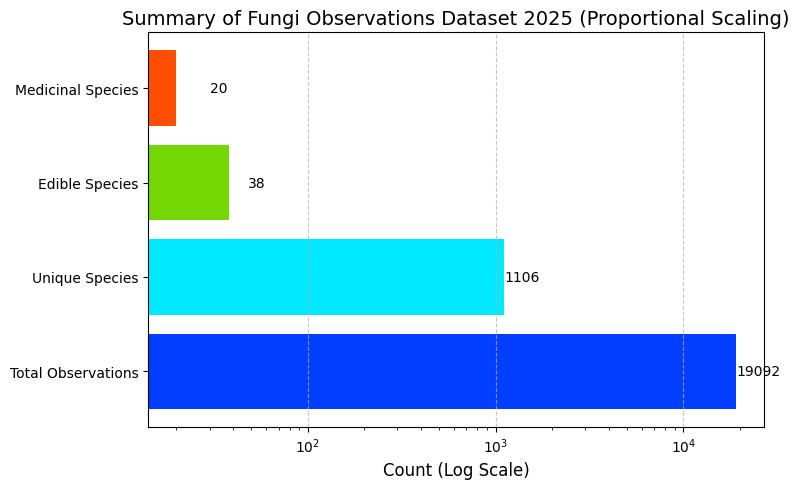

In [34]:
# Data for visualization
categories = ['Total Observations', 'Unique Species', 'Edible Species', 'Medicinal Species']
values = [total_observations, unique_species_count, edible_count, medicinal_count]

# Define the color theme (e.g., seaborn's "coolwarm" palette)
colors = ['#023eff', '#00e9ff', '#75d701', '#ff4e00']

# Plot the data
plt.figure(figsize=(8, 5))
bars = plt.barh(categories, values, color=colors)

# Add text annotations for each bar
for bar, count in zip(bars, values):
    plt.text(bar.get_width() + 10, bar.get_y() + bar.get_height()/2, f'{count}', va='center', fontsize=10)

# Apply log scaling to x-axis
plt.xscale('log')
plt.xlabel('Count (Log Scale)', fontsize=12)
plt.title('Summary of Fungi Observations Dataset '+data_cleaned_year+' (Proportional Scaling)', fontsize=14)

# Add gridlines for better readability
plt.grid(axis='x', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()


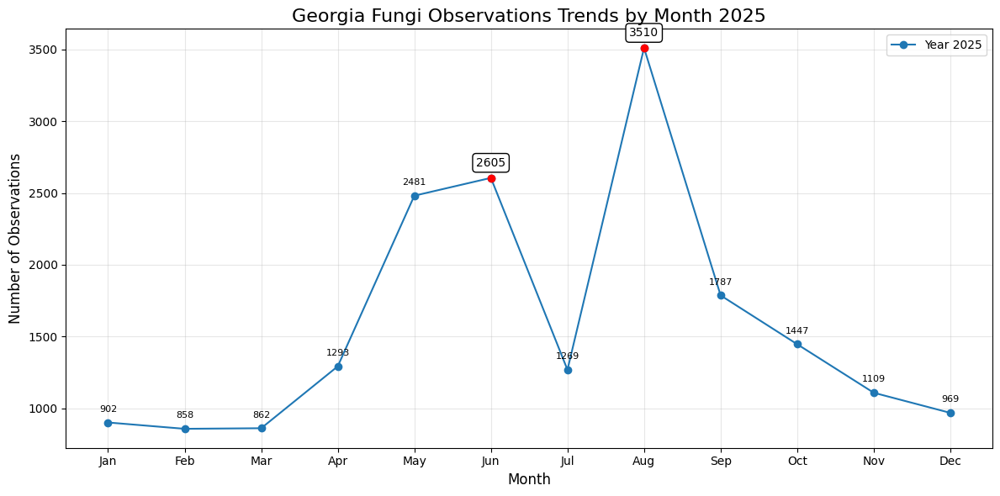

In [35]:

# Group by year and month, and count the number of observations
monthly_trends = data_cleaned.groupby(['year', 'month']).size().reset_index(name='observations')

# Pivot data for better visualization (optional)
monthly_trends_pivot = monthly_trends.pivot(index='month', columns='year', values='observations')

# Extract the highest two peak months
peak_months = monthly_trends_pivot[int(data_cleaned_year)].nlargest(2)

# Plotting overall observation trends
plt.figure(figsize=(12, 6))

for year in monthly_trends['year'].unique():
    plt.plot(monthly_trends_pivot.index, monthly_trends_pivot[year], marker='o', label=f'Year {year}')

    # Add data labels for each point
    for month, observation in zip(monthly_trends_pivot.index, monthly_trends_pivot[year]):
        if not pd.isna(observation):  # Skip NaN values
            plt.text(month, observation + 75, f'{int(observation)}', ha='center', fontsize=8)
    
# Highlight the highest two peak months
for month, value in peak_months.items():
    plt.annotate(
        f"{value}",  # Text to annotate (observation count)
        (month, value),  # Coordinates (x, y)
        textcoords="offset points",  # Position relative to the point
        xytext=(0, 10),  # Offset (x, y) in points
        ha='center',  # Horizontal alignment
        fontsize=10,
        bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white')
    )
    plt.scatter(month, value, color='red', zorder=5)  # Highlight the point with a red marker

plt.title('Georgia Fungi Observations Trends by Month '+ data_cleaned_year , fontsize=16)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Number of Observations', fontsize=12)
plt.legend()
plt.grid(alpha=0.3)
plt.xticks(ticks=range(1, 13), labels=[
    'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
    'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'
])
plt.tight_layout()

# Show plot
plt.show()

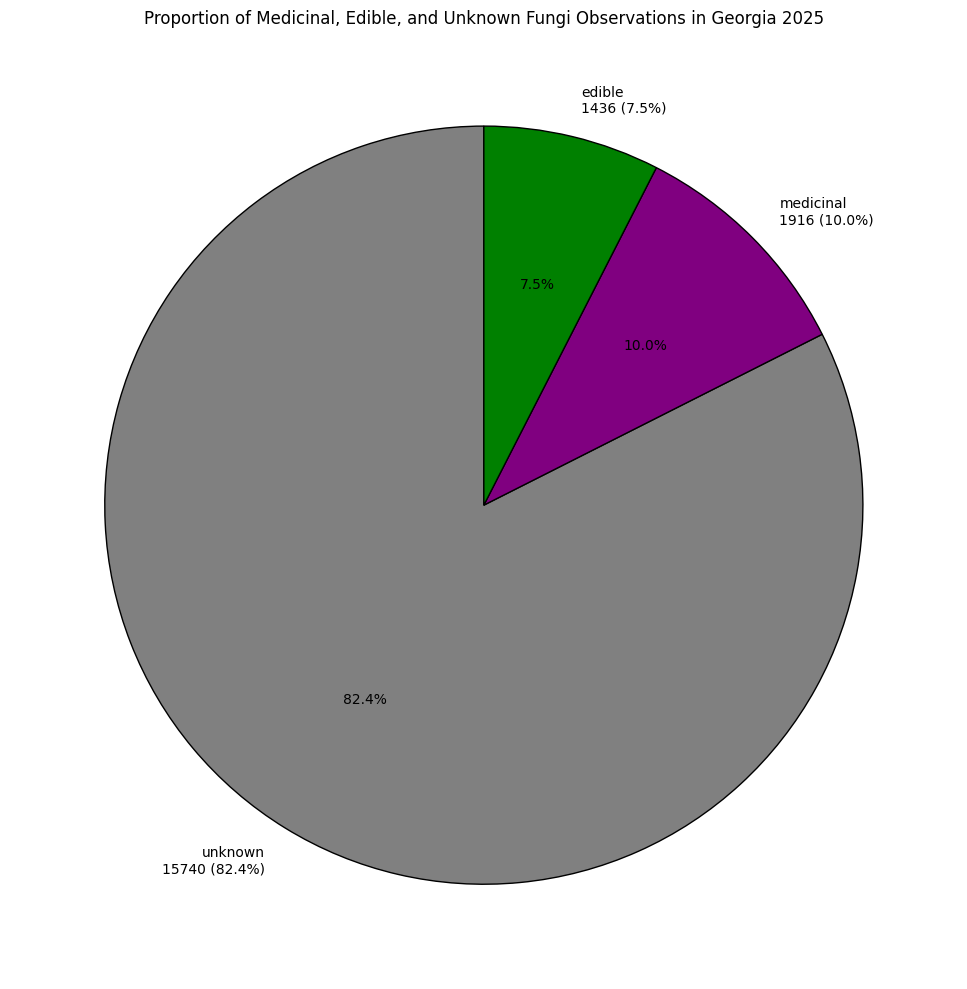

In [36]:


# Calculate percentages and counts
edibility_counts = data_cleaned['edibility'].value_counts()
edibility_percentages = edibility_counts / edibility_counts.sum() * 100

# Prepare labels with counts and percentages
labels = [f"{index}\n{value} ({percentage:.1f}%)" for index, value, percentage in zip(edibility_counts.index, edibility_counts, edibility_percentages)]

# Colors for the pie chart
colors = ['grey', 'purple', 'green']

# Plot the pie chart
plt.figure(figsize=(10, 10))
plt.pie(
    edibility_counts, 
    labels=labels, 
    colors=colors, 
    autopct='%1.1f%%', 
    startangle=90, 
    wedgeprops={'edgecolor': 'black'}
)

plt.title("Proportion of Medicinal, Edible, and Unknown Fungi Observations in Georgia "+data_cleaned_year, fontsize=12)
plt.tight_layout()
plt.show()



# Top 10 Most Observed Fungi:
Use scientific_name or common_name to identify the most frequently observed species.

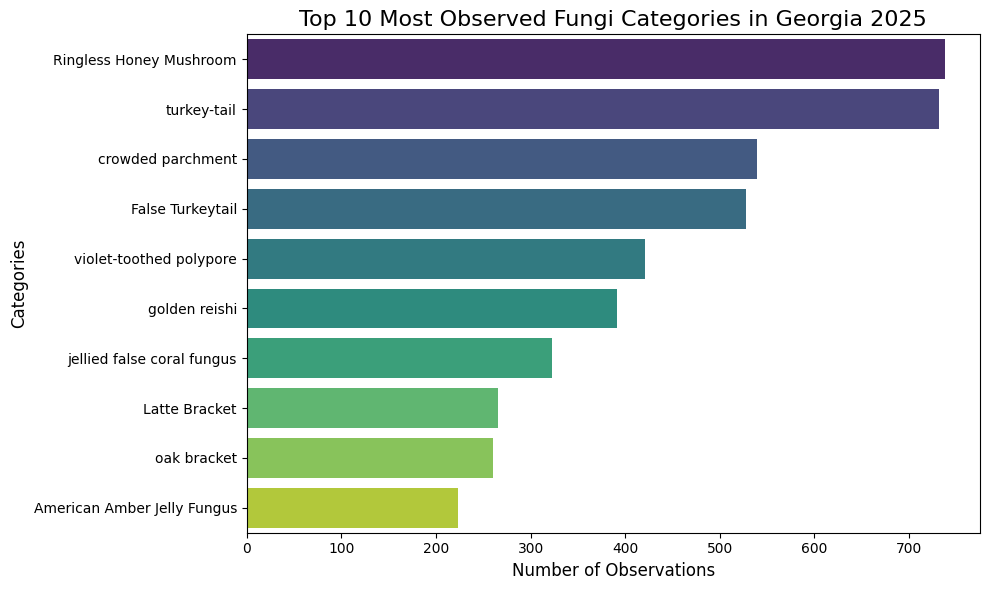

In [37]:
# Step 1: Group by common_name and count the number of observations for each species
fungi_counts = data_cleaned.groupby('common_name').size().reset_index(name='observations')

# Step 2: Sort the species by the number of observations in descending order
fungi_counts_sorted = fungi_counts.sort_values(by='observations', ascending=False)

# Step 3: Extract the top 10 fungi
top_10_fungi = fungi_counts_sorted.head(10)

# Step 4: Plot the data
plt.figure(figsize=(10, 6))
sns.barplot(
    data=top_10_fungi,
    x='observations',
    y='common_name',
    palette='viridis',
    hue='common_name',
    legend=False
)

plt.title('Top 10 Most Observed Fungi Categories in Georgia '+ data_cleaned_year, fontsize=16)
plt.xlabel('Number of Observations', fontsize=12)
plt.ylabel('Categories', fontsize=12)
plt.tight_layout()

# Show the plot
plt.show()



# Edible and Medicinal Species Analysis
Cross-reference with the updated edible_species and medicinal_species lists to find the top 5 species in each category.
Break this down further by seasonal trends (using observed_on).

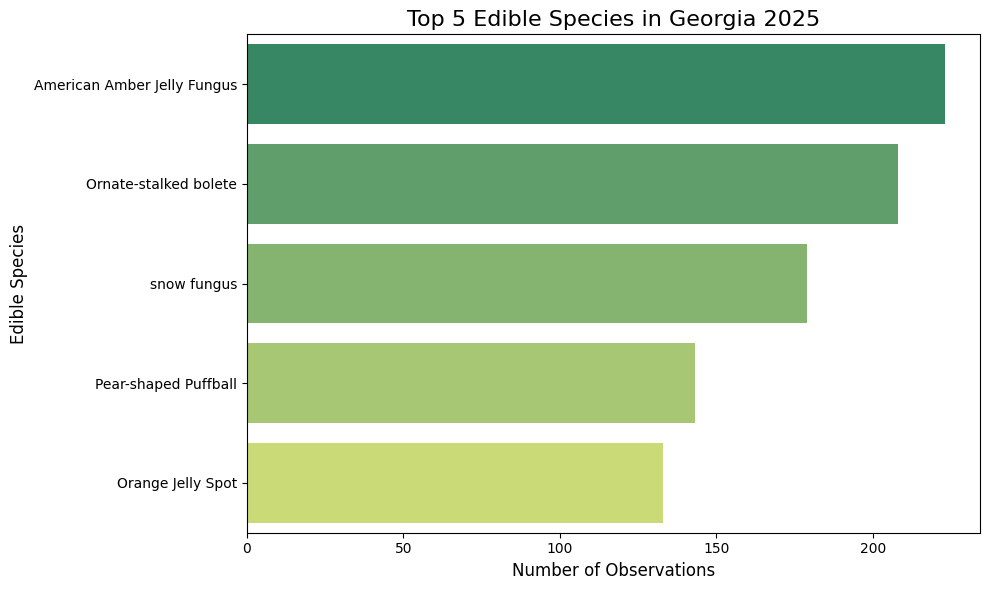

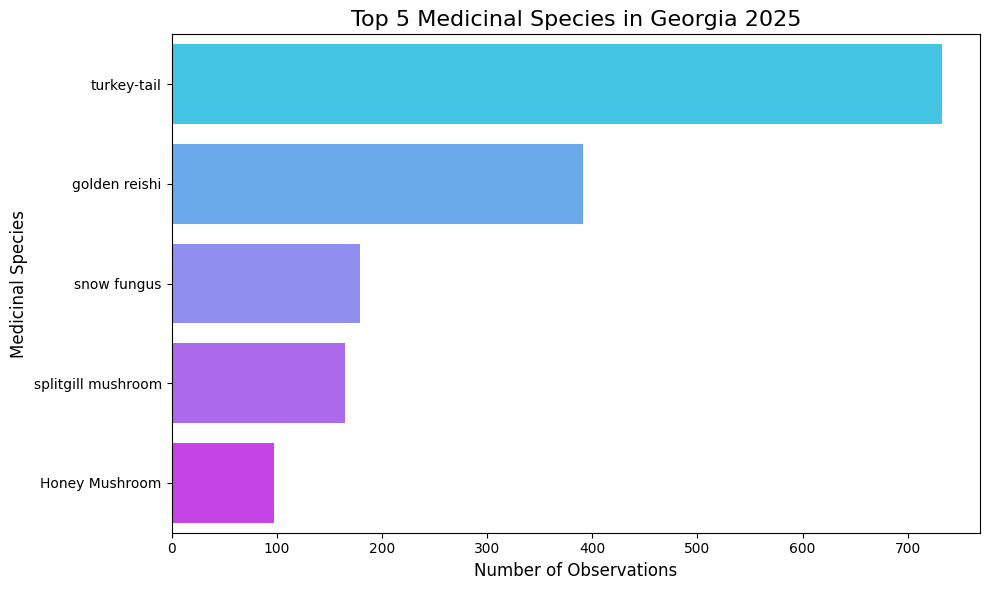

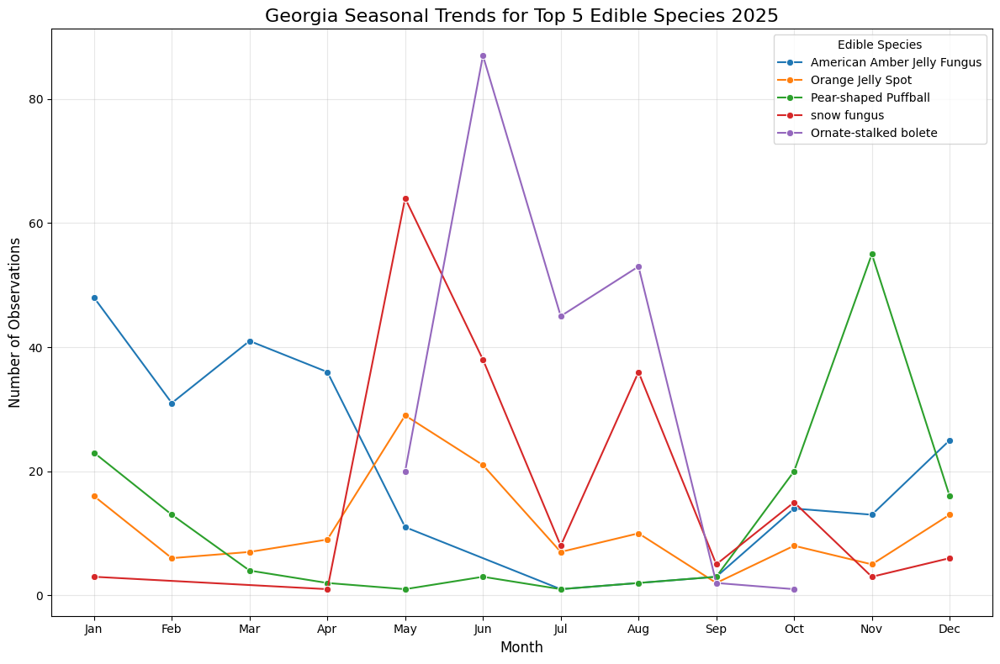

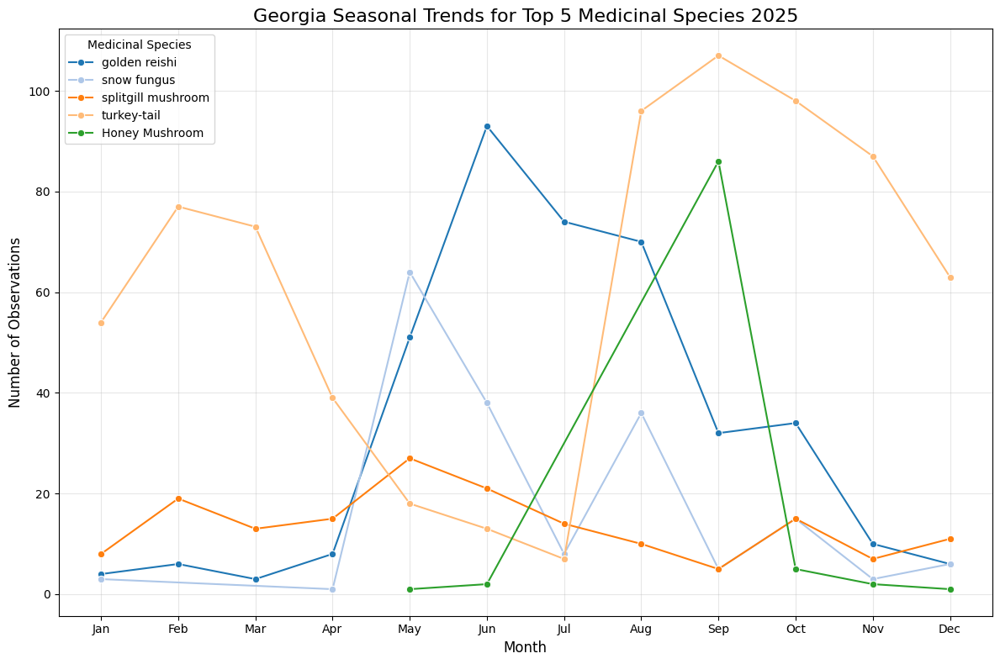

In [38]:
# Filter the dataset for edible and medicinal species
edible_data = data_cleaned[data_cleaned["scientific_name"].isin(edible_species)]
medicinal_data = data_cleaned[data_cleaned["scientific_name"].isin(medicinal_species)]

# Group by common_name and count the number of observations for each category
top_edible = edible_data.groupby("common_name").size().reset_index(name="observations")
top_medicinal = medicinal_data.groupby("common_name").size().reset_index(name="observations")

# Sort and extract the top 5 species for each category
top_5_edible = top_edible.sort_values(by="observations", ascending=False).head(5)
top_5_medicinal = top_medicinal.sort_values(by="observations", ascending=False).head(5)

# Extract the month for seasonal trends analysis
edible_data.loc[:, "month"] = edible_data["observed_on"].dt.month
medicinal_data.loc[:, "month"] = medicinal_data["observed_on"].dt.month

# Filter seasonal trends for the top 5 species
seasonal_edible = edible_data[edible_data["common_name"].isin(top_5_edible["common_name"])]
seasonal_medicinal = medicinal_data[medicinal_data["common_name"].isin(top_5_medicinal["common_name"])]

# Group by month and common_name to find seasonal trends
seasonal_edible_trends = seasonal_edible.groupby(["month", "common_name"]).size().reset_index(name="observations")
seasonal_medicinal_trends = seasonal_medicinal.groupby(["month", "common_name"]).size().reset_index(name="observations")


# Plot for top 5 edible species
plt.figure(figsize=(10, 6))
sns.barplot(
    data=top_5_edible,
    x="observations",
    y="common_name",
    hue = "common_name",
    palette= "summer",
    legend = False
)
plt.title("Top 5 Edible Species in Georgia "+ data_cleaned_year, fontsize=16)
plt.xlabel("Number of Observations", fontsize=12)
plt.ylabel("Edible Species", fontsize=12)
plt.tight_layout()
plt.show()


# Plot for top 5 medicinal species
plt.figure(figsize=(10, 6))
sns.barplot(
    data=top_5_medicinal, 
    x="observations", 
    y="common_name", 
    palette="cool",
    hue="common_name",
    legend=False
)
plt.title("Top 5 Medicinal Species in Georgia "+ data_cleaned_year, fontsize=16)
plt.xlabel("Number of Observations", fontsize=12)
plt.ylabel("Medicinal Species", fontsize=12)
plt.tight_layout()
plt.show()


# Visualization for Seasonal Trends (Line Plot)
# Edible species trends
plt.figure(figsize=(12, 8))
sns.lineplot(
    data=seasonal_edible_trends, 
    x="month", 
    y="observations", 
    hue="common_name", 
    marker="o", 
    palette="tab10"
)
plt.title("Georgia Seasonal Trends for Top 5 Edible Species "+ data_cleaned_year, fontsize=16)
plt.xlabel("Month", fontsize=12)
plt.ylabel("Number of Observations", fontsize=12)
plt.legend(title="Edible Species")
plt.grid(alpha=0.3)

# Update x-axis with month names
month_mapping = {1: "Jan", 2: "Feb", 3: "Mar", 4: "Apr", 5: "May", 6: "Jun",
                 7: "Jul", 8: "Aug", 9: "Sep", 10: "Oct", 11: "Nov", 12: "Dec"}
plt.xticks(ticks=range(1, 13), labels=[month_mapping[i] for i in range(1, 13)])

plt.tight_layout()
plt.show()


# Medicinal species trends
plt.figure(figsize=(12, 8))
sns.lineplot(
    data=seasonal_medicinal_trends, 
    x="month", 
    y="observations", 
    hue="common_name", 
    marker="o", 
    palette="tab20"
)
plt.title("Georgia Seasonal Trends for Top 5 Medicinal Species "+ data_cleaned_year, fontsize=16)
plt.xlabel("Month", fontsize=12)
plt.ylabel("Number of Observations", fontsize=12)
plt.legend(title="Medicinal Species")
plt.grid(alpha=0.3)

# Update x-axis with month names
plt.xticks(ticks=range(1, 13), labels=[month_mapping[i] for i in range(1, 13)])

plt.tight_layout()
plt.show()




# Top 5 Counties for Observations:

Aggregate data by place_county_name and find the counties with the most observations.


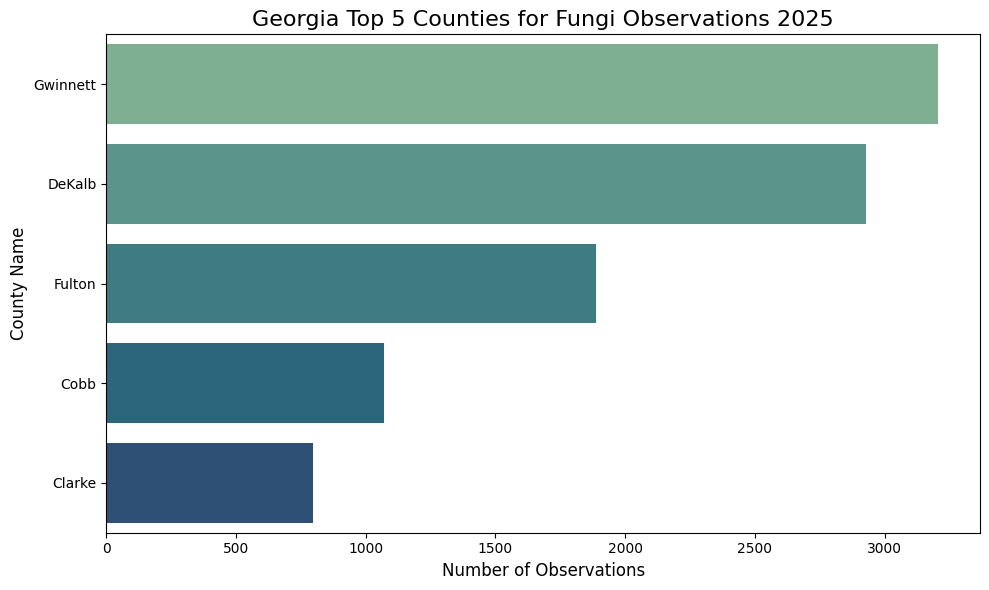

In [39]:
# Top 5 Counties for Observations:
# Step 1: Group by place_county_name and count observations
county_counts = data_cleaned.groupby('place_county_name').size().reset_index(name='observations')

# Step 2: Sort by the number of observations and select the top 5 counties
top_5_counties = county_counts.sort_values(by='observations', ascending=False).head(5)

# Step 3: Create a bar plot
plt.figure(figsize=(10, 6))
sns.barplot(data=top_5_counties, 
            x='observations', 
            y='place_county_name', 
            palette='crest',
            hue='place_county_name',
            legend=False
            )

# Step 4: Add labels and title
plt.title('Georgia Top 5 Counties for Fungi Observations '+data_cleaned_year, fontsize=16)
plt.xlabel('Number of Observations', fontsize=12)
plt.ylabel('County Name', fontsize=12)
plt.tight_layout()

# Show the plot
plt.show()


# Heatmap of Observations:

Use latitude and longitude to create a heatmap visualizing observation hotspots.

In [40]:
import folium
from folium.plugins import MarkerCluster

# Set up the map centered around Georgia
map_center = [32.1656, -82.9001]  # Latitude and longitude for Georgia
m = folium.Map(location=map_center, zoom_start=7)

# Add a marker for each observation with color coding
for idx, row in data_cleaned.iterrows():
    if row['edibility'] == 'edible':
        color = 'green'
    elif row['edibility'] == 'medicinal':
        color = 'purple'
    else:
        color = 'blue'  # Default color for unknown edibility

    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.6
    ).add_to(m)

# Add a custom legend
legend_html = '''
<div style="
    position: fixed;
    bottom: 50px; right: 50px; width: 200px; height: 150px; 
    background-color: white; border:2px solid grey; z-index:9999; font-size:14px;
    padding: 10px;">
    <b>Legend - GA Fungi Observations 2024</b><br>
    <i style="background:green; width:10px; height:10px; display:inline-block;"></i> Edible<br>
    <i style="background:purple; width:10px; height:10px; display:inline-block;"></i> Medicinal<br>
    <i style="background:blue; width:10px; height:10px; display:inline-block;"></i> Unknown<br>
</div>
'''
m.get_root().html.add_child(folium.Element(legend_html))

# save the map to file
m.save('fungi_observations_map '+data_cleaned_year+'.html')

# Display the map
m


